# Landsat-8 on AWS


<div class="alert-info">

### Overview
    
* **teaching:** 30 minutes
* **exercises:** 0
* **questions:**
    * How can I find, anaylize, and visualize a large set of Landsat-8 imagery on AWS?
    
</div>

We will examine raster images from the [Landsat-8 instrument](https://www.usgs.gov/land-resources/nli/landsat). The Landsat program is the longest-running civilian satellite imagery program, with the first satellite launched in 1972 by the US Geological Survey. Landsat 8 is the latest satellite in this program, and was launched in 2013. Landsat observations are processed into “scenes”, each of which is approximately 183 km x 170 km, with a spatial resolution of 30 meters and a temporal resolution of 16 days. The duration of the landsat program makes it an attractive source of medium-scale imagery for land surface change analyses.

This notebook is a simplified update of a [blog post written in October 2018](https://medium.com/pangeo/cloud-native-geoprocessing-of-earth-observation-satellite-data-with-pangeo-997692d91ca2)

### Table of contents

1. [**Sat-search**](#Sat-search)
1. [**Holoviz visualization**](#Holoviz)
1. [**Rasterio and xarray**](#Rasterio-and-xarray)

## Finding data on the Cloud 

Finding geospatial data on the Cloud has been difficult until recent years. Earth scientists are accustomed to going to specific portals to find data, for example [NASA's Earthdata Search](https://search.earthdata.nasa.gov), ESA's Copernicus Hub (https://scihub.copernicus.eu), USGS National Map (https://www.usgs.gov/core-science-systems/national-geospatial-program/national-map). AWS has had a registry of open datasets stored on AWS for many years now https://aws.amazon.com/opendata/public-datasets/.  Earth-science specific data is also listed here - https://aws.amazon.com/earth/. But what if you want to search for Landsat8 data over an area of interest? Browsing through lists of files is cumbersome. 

An effort is underway to make geospatial data on the Cloud more easy to discover by having a bare-bones web-friendly and search-friendly metadata catalog standard: The SpatioTemporal Asset Catalog (STAC). Once the standard is set, many tools can co-exist to build upon it. For example https://www.element84.com/earth-search/ allows us to programmatically and visually search for data on AWS! Here we will use the [satsearch Python library](https://github.com/sat-utils/sat-search) for searching Landsat8 on AWS. Note you could also search for Sentinel2

In [1]:
# if a library is missing from the base environment, install with one of these options:
#!pip install sat-search==0.2.2 
#!conda install sat-search=0.2.2 -c conda-forge -y
import satsearch
print(satsearch.__version__)

0.2.3


In [2]:
wa_bbox = {
  "type": "Feature",
  "properties": {},
  "geometry": {
    "type": "Polygon",
    "coordinates": [
      [
        [
          -124.71679687499999,
          45.47554027158593
        ],
        [
          -116.78466796875,
          45.47554027158593
        ],
        [
          -116.78466796875,
          48.93693495409401
        ],
        [
          -124.71679687499999,
          48.93693495409401
        ],
        [
          -124.71679687499999,
          45.47554027158593
        ]
      ]
    ]
  }
}

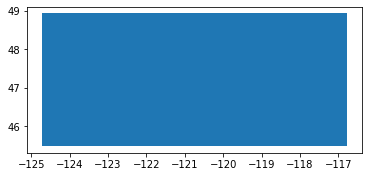

In [3]:
import geopandas as gpd
from shapely.geometry import Polygon
polygon = Polygon(wa_bbox["geometry"]["coordinates"][0])
gfa = gpd.GeoDataFrame([polygon], columns=["geometry"])
gfa.plot()

In [4]:
properties =  ["landsat:tier=T1"] 
bbox = (gfa.bounds.minx[0], gfa.bounds.miny[0], gfa.bounds.maxx[0], gfa.bounds.maxy[0]) #(west, south, east, north) 
results = satsearch.Search.search(collection='landsat-8-l1', 
                        bbox=bbox, 
                        sort=['<datetime'], #earliest scene first
                        property=properties)
print('%s items' % results.found())
items = results.items()
items.save('set.geojson')

528 items


In [5]:
# Remember that it is easy to load geojson with geopandas!
gf = gpd.read_file('set.geojson')
gf.head()

,id,collection,eo:gsd,eo:platform,eo:instrument,eo:off_nadir,eo:bands,datetime,eo:sun_azimuth,eo:sun_elevation,eo:cloud_cover,eo:row,eo:column,landsat:product_id,landsat:scene_id,landsat:processing_level,landsat:tier,landsat:revision,eo:epsg,geometry
0,LC80440262019091,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-01T18:42:26,154.288723,43.044424,10,026,044,LC08_L1TP_044026_20190401_20190421_01_T1,LC80440262019091LGN00,L1TP,T1,00,32611,"POLYGON ((-119.12627 49.94999, -116.55825 49.4..."
1,LC80440272019091,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-01T18:42:49,153.082585,44.178184,3,027,044,LC08_L1TP_044027_20190401_20190421_01_T1,LC80440272019091LGN00,L1TP,T1,00,32611,"POLYGON ((-119.66657 48.54267, -117.16851 48.0..."
2,LC80440282019091,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-01T18:43:13,151.849599,45.298122,64,028,044,LC08_L1TP_044028_20190401_20190421_01_T1,LC80440282019091LGN00,L1TP,T1,00,32611,"POLYGON ((-120.18032 47.13222, -117.73494 46.6..."
3,LC80440292019091,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-01T18:43:37,150.584316,46.403094,100,029,044,LC08_L1TP_044029_20190401_20190421_01_T1,LC80440292019091LGN00,L1TP,T1,00,32611,"POLYGON ((-120.67318 45.71905, -118.27802 45.2..."
4,LC80420292019093,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-03T18:31:15,150.383392,47.169181,87,029,042,LC08_L1TP_042029_20190403_20190421_01_T1,LC80420292019093LGN00,L1TP,T1,00,32611,"POLYGON ((-117.59771 45.66215, -115.21465 45.2..."


In [6]:
# Plot search AOI and frames on a map using Holoviz Libraries
import geoviews as gv
import hvplot.xarray
import hvplot.pandas

cols = gf.loc[:,('id','eo:row','eo:column','geometry')]
aoi = gfa.hvplot(geo=True, line_color='b', fill_color=None)
footprints = cols.hvplot(geo=True, line_color='k', hover_cols=['eo:row','eo:column'], alpha=0.1, title='Landsat 8 T1')
tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
labels = gv.tile_sources.StamenLabels.options(level='annotation')
tiles * footprints * aoi *  labels

:Overlay
   .WMTS.I      :WMTS   [Longitude,Latitude]
   .Polygons.I  :Polygons   [Longitude,Latitude]   (eo:row,eo:column)
   .Polygons.II :Polygons   [Longitude,Latitude]
   .WMTS.II     :WMTS   [Longitude,Latitude]

In [7]:
# Let's adjust our query and  just work with imagery from a particular path and row for starters
properties =  ["eo:row=027",
               "eo:column=047",
               "landsat:tier=T1"] 
results = satsearch.Search.search(collection='landsat-8-l1', 
                        sort=['<datetime'], #earliest scene first
                        property=properties)
print('%s items' % results.found())
items = results.items()
items.save('subset.geojson')

18 items


In [8]:
# Remember that it is easy to load geojson with geopandas!
gf = gpd.read_file('subset.geojson')
gf.head()

,id,collection,eo:gsd,eo:platform,eo:instrument,eo:off_nadir,eo:bands,datetime,eo:sun_azimuth,eo:sun_elevation,eo:cloud_cover,eo:row,eo:column,landsat:product_id,landsat:scene_id,landsat:processing_level,landsat:tier,landsat:revision,eo:epsg,geometry
0,LC80470272019096,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""name"": ""B1"", ""common_name"": ""coastal"", ""g...",2019-04-06T19:01:20,152.713795,46.106183,79,027,047,LC08_L1TP_047027_20190406_20190422_01_T1,LC80470272019096LGN00,L1TP,T1,00,32610,"POLYGON ((-124.30921 48.51312, -121.80425 48.0..."
1,LC80470272019128,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-05-08T19:01:19,149.213545,56.592420,19,027,047,LC08_L1TP_047027_20190508_20190521_01_T1,LC80470272019128LGN00,L1TP,T1,00,32610,"POLYGON ((-124.27756 48.51300, -121.77234 48.0..."
2,LC80470272019160,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-06-09T19:01:37,143.652070,61.668260,63,027,047,LC08_L1TP_047027_20190609_20190619_01_T1,LC80470272019160LGN00,L1TP,T1,00,32610,"POLYGON ((-124.28944 48.51325, -121.78398 48.0..."
3,LC80470272019176,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-06-25T19:01:42,141.834366,61.713605,52,027,047,LC08_L1TP_047027_20190625_20190705_01_T1,LC80470272019176LGN00,L1TP,T1,00,32610,"POLYGON ((-124.28314 48.51335, -121.77799 48.0..."
4,LC80470272019208,landsat-8-l1,15,landsat-8,OLI_TIRS,0,"[ { ""full_width_half_max"": 0.02, ""center_wavel...",2019-07-27T19:01:51,143.987513,57.532989,76,027,047,LC08_L1TP_047027_20190727_20190801_01_T1,LC80470272019208LGN00,L1TP,T1,00,32610,"POLYGON ((-124.26661 48.51255, -121.76179 48.0..."


In [9]:
# Hack for neat display of band information
import ast
import pandas as pd
band_info = pd.DataFrame(ast.literal_eval(gf.iloc[0]['eo:bands']))
band_info

,name,common_name,gsd,center_wavelength,full_width_half_max
0,B1,coastal,30,0.44,0.02
1,B2,blue,30,0.48,0.06
2,B3,green,30,0.56,0.06
3,B4,red,30,0.65,0.04
4,B5,nir,30,0.86,0.03
5,B6,swir16,30,1.60,0.08
6,B7,swir22,30,2.20,0.20
7,B8,pan,15,0.59,0.18
8,B9,cirrus,30,1.37,0.02
9,B10,lwir11,100,10.90,0.80


## ipywidgets

[ipywidgets](https://ipywidgets.readthedocs.io/en/latest/) provide another convenient approach to custom visualizations. The function below allows us to browse through all the image thumbnails for a group of images (more specifically a specific Landsat8 path and row). 

In [10]:
from ipywidgets import interact
from IPython.display import display, Image

def browse_images(items):
    n = len(items)

    def view_image(i=0):
        item = items[i]
        print(f"id={item.id}\tdate={item.datetime}\tcloud%={item['eo:cloud_cover']}")
        display(Image(item.asset('thumbnail')['href']))
    
    interact(view_image, i=(0,n-1))

id=LC80470272019096	date=2019-04-06 19:01:20.935226+00:00	cloud%=79


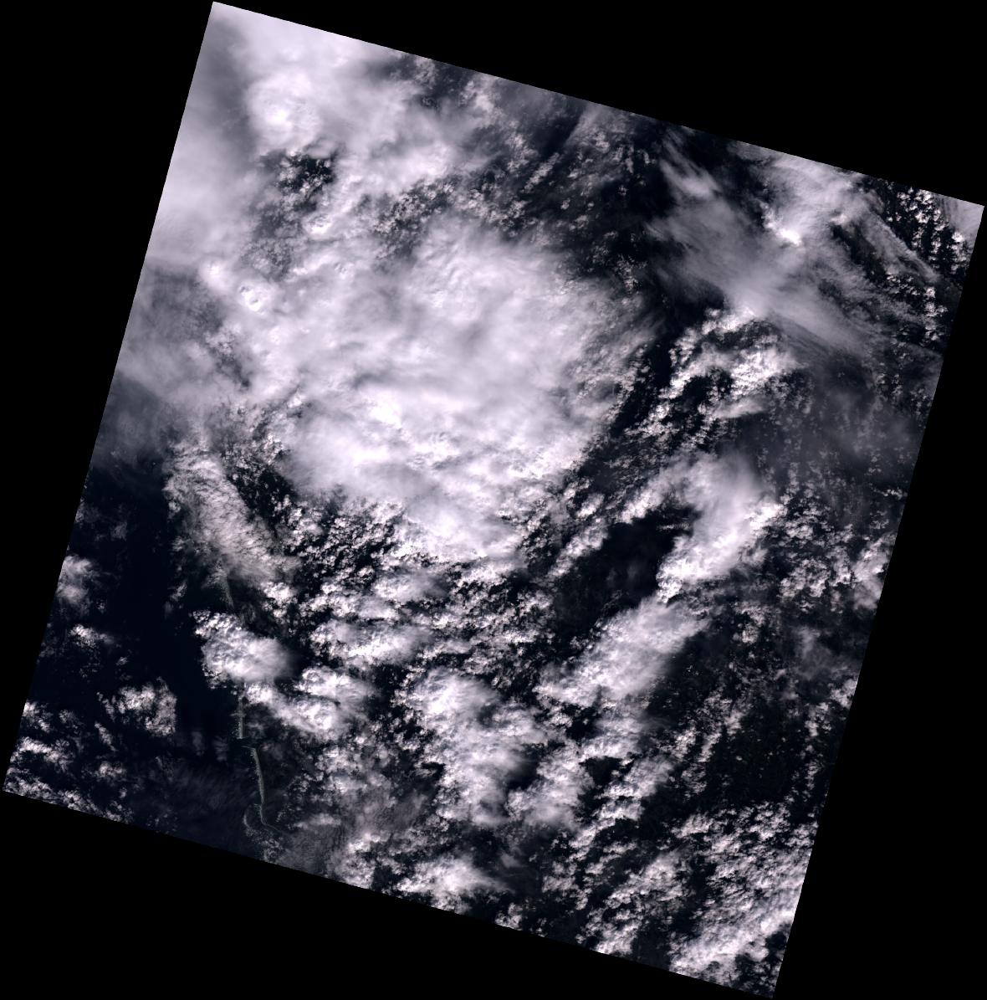

In [11]:
browse_images(items)

### Intac-STAC

the intake-stac library allows us to easily load these scenes described with STAC metadata into xarray DataArrays! NOTE this library is very new and will likely undergo changes in the near future. https://github.com/pangeo-data/intake-stac

In [12]:
import intake
import intake_stac
print(intake.__version__)
print(intake_stac.__version__)

0.6.0
0.2.3


In [13]:
#catalog = intake.open_stac_item_collection(results.items())
catalog = intake.open_stac_item_collection(items)

In [14]:
list(catalog)

['LC80470272019096',
 'LC80470272019128',
 'LC80470272019160',
 'LC80470272019176',
 'LC80470272019208',
 'LC80470272019224',
 'LC80470272019240',
 'LC80470272019272',
 'LC80470272019288',
 'LC80470272019304',
 'LC80470272019336',
 'LC80470272020003',
 'LC80470272020051',
 'LC80470272020083',
 'LC80470272020099',
 'LC80470272020131',
 'LC80470272020147',
 'LC80470272020163']

In [15]:
sceneid = 'LC80470272019096'
print(catalog[sceneid])
#catalog[sceneid].metadata

<Intake catalog: LC80470272019096>


In [16]:
# These are the bands or assets available to us
list(catalog[sceneid])

['index',
 'thumbnail',
 'B1',
 'B2',
 'B3',
 'B4',
 'B5',
 'B6',
 'B7',
 'B8',
 'B9',
 'B10',
 'B11',
 'ANG',
 'MTL',
 'BQA']

In [17]:
catalog[sceneid]['B2'].metadata

{'type': 'image/x.geotiff',
 'eo:bands': [1],
 'title': 'Band 2 (blue)',
 'href': 'https://landsat-pds.s3.amazonaws.com/c1/L8/047/027/LC08_L1TP_047027_20190406_20190422_01_T1/LC08_L1TP_047027_20190406_20190422_01_T1_B2.TIF',
 'catalog_dir': ''}

In [18]:
# Let's work with this in xarray
import xarray as xr
xr.set_options(display_style="html")

item = catalog[sceneid]
da = item['B2'].to_dask()
da.data

dask.array<open_rasterio-1ecc1a70573cd3dfa46fa2112336f2d0<this-array>, shape=(1, 7971, 7871), dtype=uint16, chunksize=(1, 7971, 7871), chunktype=numpy.ndarray>

## Dask Chunks and Cloud Optimized Geotiffs

Since we didn't specify chunk sizes, everything is read as one chunk. When we load larger sets of imagery
we can change these chunk sizes to use dask. It's best to align dask chunks with the way image chunks (typically called "tiles" are stored on disk or cloud storage buckets. The landsat data is stored on AWS S3 in a tiled Geotiff format where tiles are 512x512, so we should pick som multiple of that, and typically aim for chunksizes of ~100Mb (although this is subjective). You can read more about dask chunks here: https://docs.dask.org/en/latest/array-best-practices.html

Also check out this documentation about the Cloud-optimized Geotiff format, it is an excellent choice for putting satellite raster data on Cloud storage: https://www.cogeo.org/

In [19]:

da = item.B2(chunks=dict(band=1, x=2048, y=2048)).to_dask()
da.data

dask.array<open_rasterio-7f37879b20c3ab46a5255e3cc44bead9<this-array>, shape=(1, 7971, 7871), dtype=uint16, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>

In [20]:
# Let's load all the bands into an xarray dataset!
# Actually stick to bands that have the same Ground Sample Distance for simplicity
bands = band_info.query('gsd == 30').common_name.to_list()
bands

['coastal', 'blue', 'green', 'red', 'nir', 'swir16', 'swir22', 'cirrus']

In [21]:
stacked = item.stack_bands(bands)
da = stacked(chunks=dict(band=1, x=2048, y=2048)).to_dask()
da

<xarray.DataArray (band: 8, y: 7971, x: 7871)>
dask.array<concatenate, shape=(8, 7971, 7871), dtype=uint16, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 3.525e+05 3.525e+05 3.526e+05 ... 5.886e+05 5.886e+05
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
  * band     (band) <U2 'B1' 'B2' 'B3' 'B4' 'B5' 'B6' 'B7' 'B9'
Attributes:
    transform:      (30.0, 0.0, 352485.0, 0.0, -30.0, 5374215.0)
    crs:            +init=epsg:32610
    res:            (30.0, 30.0)
    is_tiled:       1
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Point

In [22]:
da.hvplot.image(groupby='band', rasterize=True, dynamic=True, width=700, height=500, cmap='magma')
# NOTE: exercise - convert 0 values to nans, and use a logarithmic color scale

:DynamicMap   [band]
   :Image   [y,x]   (value)

In [23]:
# If we want we can convert this to an xarray dataset, with variable names corresponding to common names
#ds = da.dim
da['band'] = bands
ds = da.to_dataset(dim='band')
print('Dataset size: [Gb]', ds.nbytes/1e9)
ds

Dataset size: [Gb] 1.003962592


<xarray.Dataset>
Dimensions:  (x: 7871, y: 7971)
Coordinates:
  * x        (x) float64 3.525e+05 3.525e+05 3.526e+05 ... 5.886e+05 5.886e+05
  * y        (y) float64 5.374e+06 5.374e+06 5.374e+06 ... 5.135e+06 5.135e+06
Data variables:
    coastal  (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    blue     (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    green    (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    red      (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    nir      (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    swir16   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    swir22   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    cirrus   (y, x) uint16 dask.array<chunksize=(2048, 2048), meta=np.ndarray>
Attributes:
    transform:      (30.0, 0.0, 352485.0, 0.0, -30.0, 5374215.0)
    crs:            +init=epsg:32610
    res:            (30.0, 30.0)
    is_tiled:       1
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Point

## Dask-Gateway Cluster

If we don't specify a specific cluster, dask will use the cores on the machine we are running our notebook on instead, lets connect to a Dask-Gateway cluster. You can read more about this cluster at https://gateway.dask.org/ .

In [24]:
# First let's construct a large dataset with all the scenes in our search so that we
# have a time dimension
# Loop through geopandas geodataframe (each row is a STAC ITEM)

datasets = []
for i,item in gf.iterrows():
    print(item.id, item.datetime)
    stacked = catalog[item.id].stack_bands(bands)
    da = stacked(chunks=dict(band=1, x=2048, y=2048)).to_dask()
    da['band'] = bands # use common names
    da = da.expand_dims(time=[pd.to_datetime(item.datetime)])
    ds = da.to_dataset(dim='band')
    datasets.append(ds)
    


LC80470272019096 2019-04-06T19:01:20
LC80470272019128 2019-05-08T19:01:19


LC80470272019160 2019-06-09T19:01:37


LC80470272019176 2019-06-25T19:01:42


LC80470272019208 2019-07-27T19:01:51


LC80470272019224 2019-08-12T19:01:57


LC80470272019240 2019-08-28T19:02:01


LC80470272019272 2019-09-29T19:02:10


LC80470272019288 2019-10-15T19:02:13


LC80470272019304 2019-10-31T19:02:13


LC80470272019336 2019-12-02T19:02:09


LC80470272020003 2020-01-03T19:02:02


LC80470272020051 2020-02-20T19:01:50


LC80470272020083 2020-03-23T19:01:36


LC80470272020099 2020-04-08T19:01:28


LC80470272020131 2020-05-10T19:01:13


LC80470272020147 2020-05-26T19:01:17


LC80470272020163 2020-06-11T19:01:26


In [25]:
DS = xr.concat(datasets, dim='time')

In [26]:
print('Dataset size: [Gb]', DS.nbytes/1e9)
DS

Dataset size: [Gb] 73.286394512


,Array,Chunk
Bytes,9.16 GB,33.55 MB
Shape,"(18, 7971, 7981)","(1, 2048, 2048)"
Count,16174 Tasks,2448 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,9.16 GB,33.55 MB
Shape,"(18, 7971, 7981)","(1, 2048, 2048)"
Count,16174 Tasks,2448 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


## Distributed computations

We'll calculate the classic NDVI index with all our data

NOTE that you should be using Landsat ARD data (https://www.usgs.gov/land-resources/nli/landsat/us-landsat-analysis-ready-data) for this with atmospheric corrections! 
this is just to illustrate the intuitive syntax of xarray


In [27]:
NDVI = (DS['nir'] - DS['red']) / (DS['nir'] + DS['red'])
NDVI

,Array,Chunk
Bytes,9.16 GB,33.55 MB
Shape,"(18, 7971, 7981)","(1, 2048, 2048)"
Count,32006 Tasks,2448 Chunks
Type,float64,numpy.ndarray


In [28]:
NDVI.data

,Array,Chunk
Bytes,9.16 GB,33.55 MB
Shape,"(18, 7971, 7981)","(1, 2048, 2048)"
Count,32006 Tasks,2448 Chunks
Type,float64,numpy.ndarray


In [29]:
from dask_gateway import GatewayCluster
from dask.distributed import Client

cluster = GatewayCluster()
client = cluster.get_client()
cluster.adapt(minimum=2, maximum=10)
cluster

### A note on distributed versus local memory

In [30]:
#ndvi_my_memory = NDVI.compute() # NOTE: will end up with 5Gb of memory on local notebook

In [31]:
#ndvi_distributed_memory = NDVI.persist() #computed data stays on the cluster

In [32]:
# Plotting pulls data from distributed cluster memory on-demand
NDVI.hvplot.image(groupby='time', x='x',y='y', rasterize=True, dynamic=True, width=700, height=500, cmap='greens')

:DynamicMap   [time]
   :Image   [x,y]   (value)

In [33]:
# Grab a subset and save as a netcdf file
sub = NDVI.sel(x=slice(4.5e5,5.0e5), y=slice(5.25e6,5.2e6)).mean(dim=['time'])
sub.hvplot.image(rasterize=True, dynamic=True, width=700, height=500, cmap='greens')

:DynamicMap   []
   :Image   [y,x]   (value)

In [34]:
myda = sub.compute() #pull subset to local memory first, some formats allow distributed writing too
myda.to_netcdf(path='myndvi.nc', engine='h5netcdf')

In [35]:
round_trip = xr.load_dataarray('myndvi.nc')

In [36]:
round_trip

<xarray.DataArray (y: 1667, x: 1667)>
array([[0.1713159 , 0.17626538, 0.18063454, ..., 0.22926841, 0.23210148,
        0.22932594],
       [0.17636533, 0.18232572, 0.1788291 , ..., 0.2183714 , 0.21799842,
        0.21675322],
       [0.17452659, 0.17469967, 0.16389727, ..., 0.22633881, 0.22692267,
        0.22522524],
       ...,
       [0.0727055 , 0.09730791, 0.11824537, ..., 0.18713841, 0.21003874,
        0.23334793],
       [0.05850726, 0.14036472, 0.14903143, ..., 0.22119264, 0.23158331,
        0.23865643],
       [0.08213042, 0.14115818, 0.18472691, ..., 0.23431417, 0.23522591,
        0.24090299]])
Coordinates:
  * x        (x) float64 4.5e+05 4.5e+05 4.501e+05 ... 4.999e+05 5e+05 5e+05
  * y        (y) float64 5.25e+06 5.25e+06 5.25e+06 ... 5.2e+06 5.2e+06 5.2e+06

In [37]:
cluster.close()